# **Setup**

* https://medium.com/@dreamferus/predictive-maintenance-in-python-exploratory-analysis-and-visualization-de363d5a39de
* https://data.nasa.gov/Aerospace/CMAPSS-Jet-Engine-Simulated-Data/ff5v-kuh6/about_data

In [1]:
import pandas as pd
import numpy as np
from tqdm.auto import tqdm
tqdm.pandas()
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.offline as pyo
pyo.init_notebook_mode()
sns.set_theme()

# **Data Import**

In [2]:
df = pd.read_csv("Input Data/train_FD001.txt", sep="\s", header=None)

print(df.shape)
df.head()

C:\Users\aksha\AppData\Local\Temp\ipykernel_16880\1740890087.py:1: ParserWarning:

Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.



(20631, 26)


,0,1,2,3,4,5,6,7,8,9,...,16,17,18,19,20,21,22,23,24,25
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,...,521.66,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,522.19,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044


In [3]:
# Specify Columns
df.columns = (["unit_number", "time_cycles", "operational_setting_1", "operational_setting_2", "operational_setting_3"] + 
    ["sensor_{}".format(i) for i in range(1, 26-5+1)])
df.head()

,unit_number,time_cycles,operational_setting_1,operational_setting_2,operational_setting_3,sensor_1,sensor_2,sensor_3,sensor_4,sensor_5,...,sensor_12,sensor_13,sensor_14,sensor_15,sensor_16,sensor_17,sensor_18,sensor_19,sensor_20,sensor_21
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,...,521.66,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,522.19,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044


# **Data Cleaning**

In [4]:
# Drop Columns With Low Variance
df = df.drop([c for c in df.columns if np.isclose(df[c].var(), 0.0) or df[c].value_counts().pipe(lambda x: x/x.sum()).iloc[0] > 0.96], axis=1)

print(df.shape)
df.head()

(20631, 18)


,unit_number,time_cycles,operational_setting_1,operational_setting_2,sensor_2,sensor_3,sensor_4,sensor_7,sensor_8,sensor_9,sensor_11,sensor_12,sensor_13,sensor_14,sensor_15,sensor_17,sensor_20,sensor_21
0,1,1,-0.0007,-0.0004,641.82,1589.70,1400.60,554.36,2388.06,9046.19,47.47,521.66,2388.02,8138.62,8.4195,392,39.06,23.4190
1,1,2,0.0019,-0.0003,642.15,1591.82,1403.14,553.75,2388.04,9044.07,47.49,522.28,2388.07,8131.49,8.4318,392,39.00,23.4236
2,1,3,-0.0043,0.0003,642.35,1587.99,1404.20,554.26,2388.08,9052.94,47.27,522.42,2388.03,8133.23,8.4178,390,38.95,23.3442
3,1,4,0.0007,0.0000,642.35,1582.79,1401.87,554.45,2388.11,9049.48,47.13,522.86,2388.08,8133.83,8.3682,392,38.88,23.3739
4,1,5,-0.0019,-0.0002,642.37,1582.85,1406.22,554.00,2388.06,9055.15,47.28,522.19,2388.04,8133.80,8.4294,393,38.90,23.4044


# **Data Processing**

## **Calc Remaining Useful Life**

In [5]:
df = (df
    .groupby("unit_number", group_keys=False)
    .apply(lambda x: x.assign(RUL=x["time_cycles"].max() - x["time_cycles"])))

print(df.shape)
df.head()

(20631, 19)


,unit_number,time_cycles,operational_setting_1,operational_setting_2,sensor_2,sensor_3,sensor_4,sensor_7,sensor_8,sensor_9,sensor_11,sensor_12,sensor_13,sensor_14,sensor_15,sensor_17,sensor_20,sensor_21,RUL
0,1,1,-0.0007,-0.0004,641.82,1589.70,1400.60,554.36,2388.06,9046.19,47.47,521.66,2388.02,8138.62,8.4195,392,39.06,23.4190,191
1,1,2,0.0019,-0.0003,642.15,1591.82,1403.14,553.75,2388.04,9044.07,47.49,522.28,2388.07,8131.49,8.4318,392,39.00,23.4236,190
2,1,3,-0.0043,0.0003,642.35,1587.99,1404.20,554.26,2388.08,9052.94,47.27,522.42,2388.03,8133.23,8.4178,390,38.95,23.3442,189
3,1,4,0.0007,0.0000,642.35,1582.79,1401.87,554.45,2388.11,9049.48,47.13,522.86,2388.08,8133.83,8.3682,392,38.88,23.3739,188
4,1,5,-0.0019,-0.0002,642.37,1582.85,1406.22,554.00,2388.06,9055.15,47.28,522.19,2388.04,8133.80,8.4294,393,38.90,23.4044,187


## **Data Split**

In [6]:
# Number Of Jet Engines
df["unit_number"].nunique()

100

In [7]:
from sklearn.model_selection import train_test_split

train_units, val_units = train_test_split(df["unit_number"].unique(), test_size=0.25, random_state=1337)
train_df = df.query("unit_number in @train_units")
val_df = df.query("unit_number in @val_units")
# "&" is the same as intersection and "|" is the same as union
# note: not empty set is equal to true
assert not (train_df["unit_number"].pipe(set) & val_df["unit_number"].pipe(set))
print(train_df["unit_number"].nunique(), val_df["unit_number"].nunique())
# => (75, 25)

75 25


# **Data Visualization**

## **Cycle Life**

In [10]:
# Cycle Life Of Each Engine
train_df.groupby("unit_number")["time_cycles"].max()[:10]

unit_number
1     192
2     287
4     189
5     269
6     188
7     259
8     150
9     201
10    222
13    163
Name: time_cycles, dtype: int64

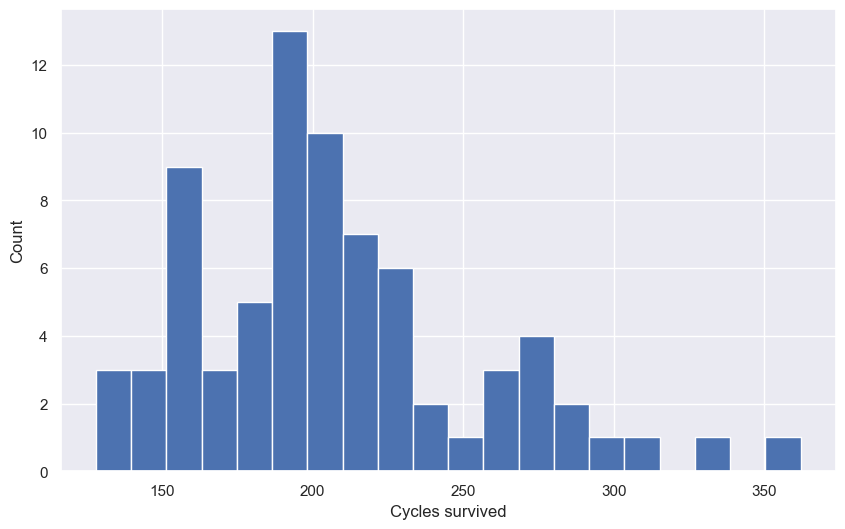

In [11]:
train_df.groupby("unit_number")["time_cycles"].max().hist(bins=20, figsize=(10, 6))
plt.xlabel("Cycles survived")
plt.ylabel("Count")
plt.show()

## **Other Features**

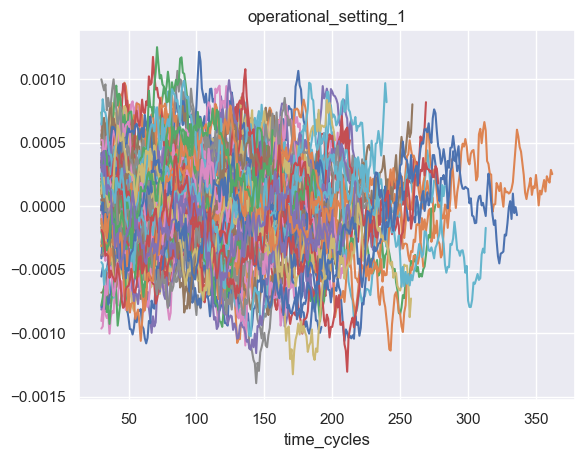

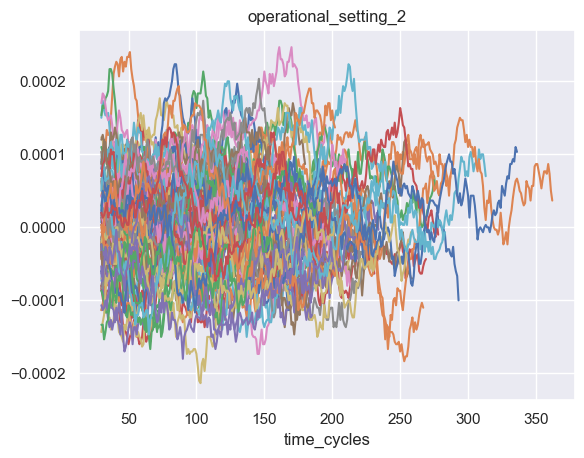

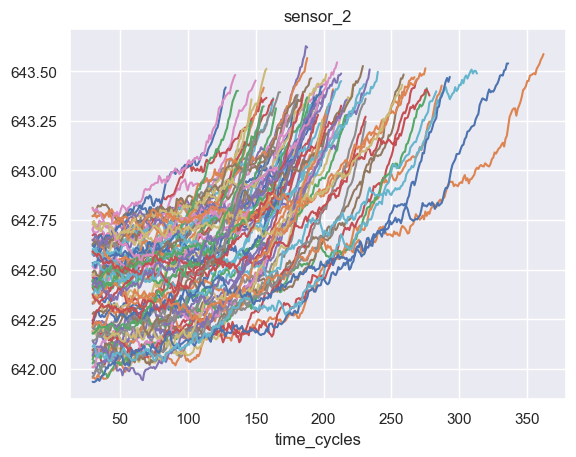

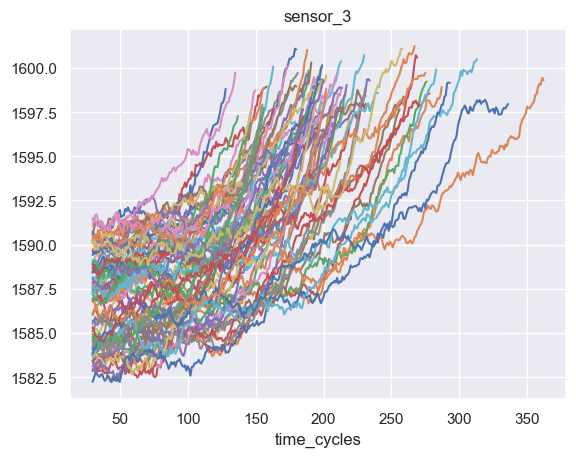

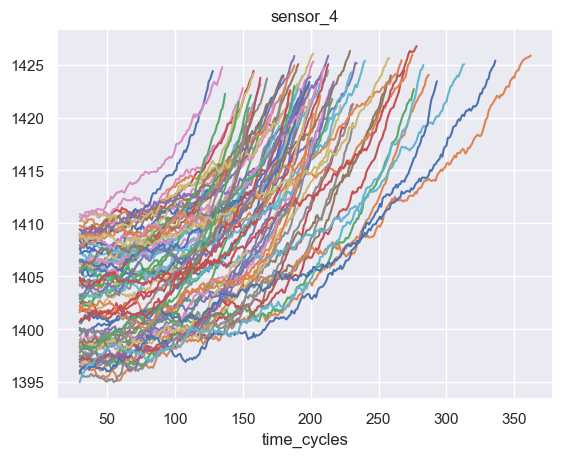

...

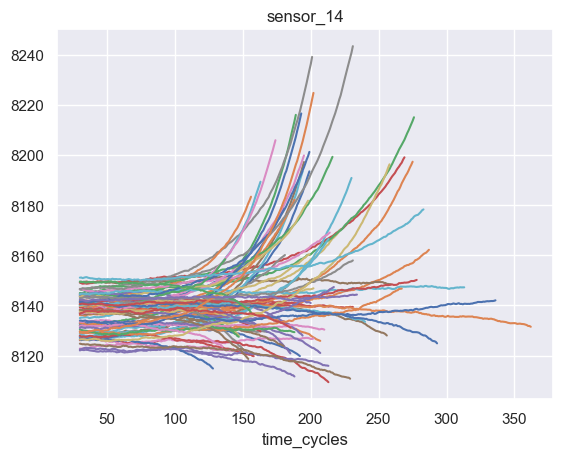

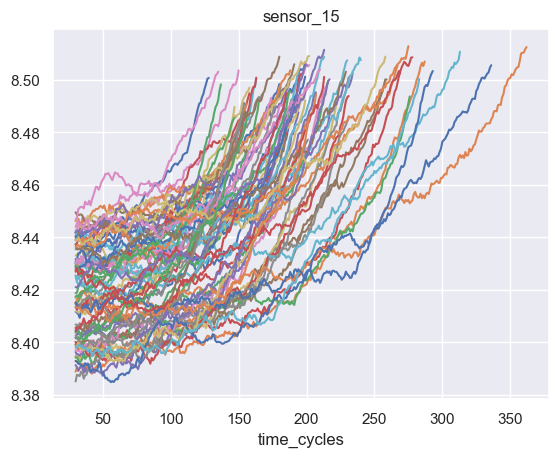

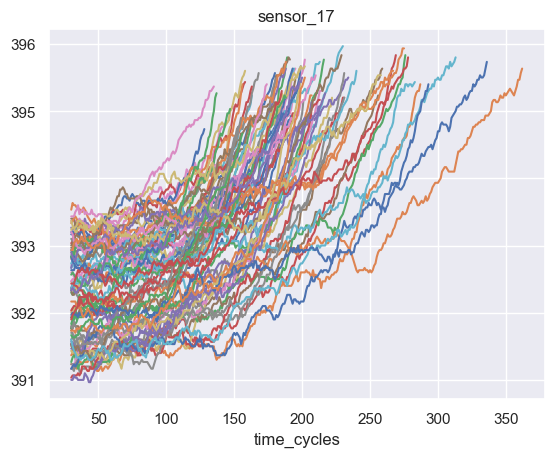

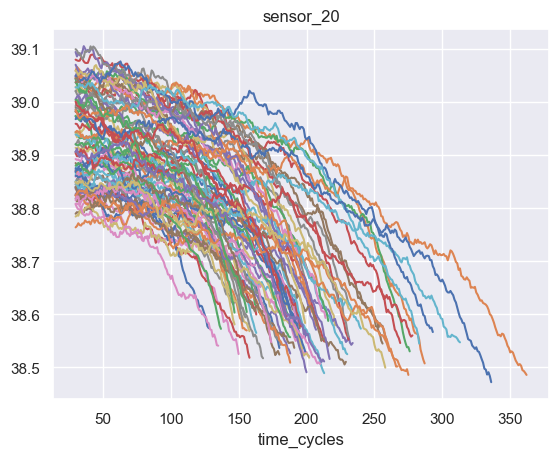

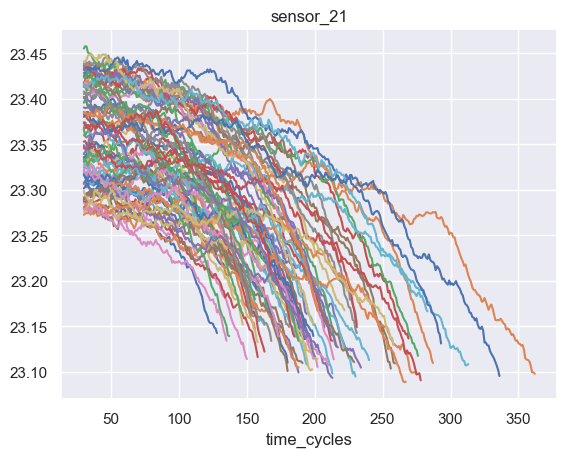

In [12]:
features = [c for c in df.columns if c not in ["unit_number", "time_cycles", "RUL"]]
for c in features:
    (train_df
         .set_index("time_cycles")
         .groupby("unit_number")
         .apply(lambda x: x[c].rolling(window=30).mean().plot(title=c)))
    plt.show()

In [ ]:
# Trends In Sensor Data is visible

## **Correlation Plot**

<Axes: >

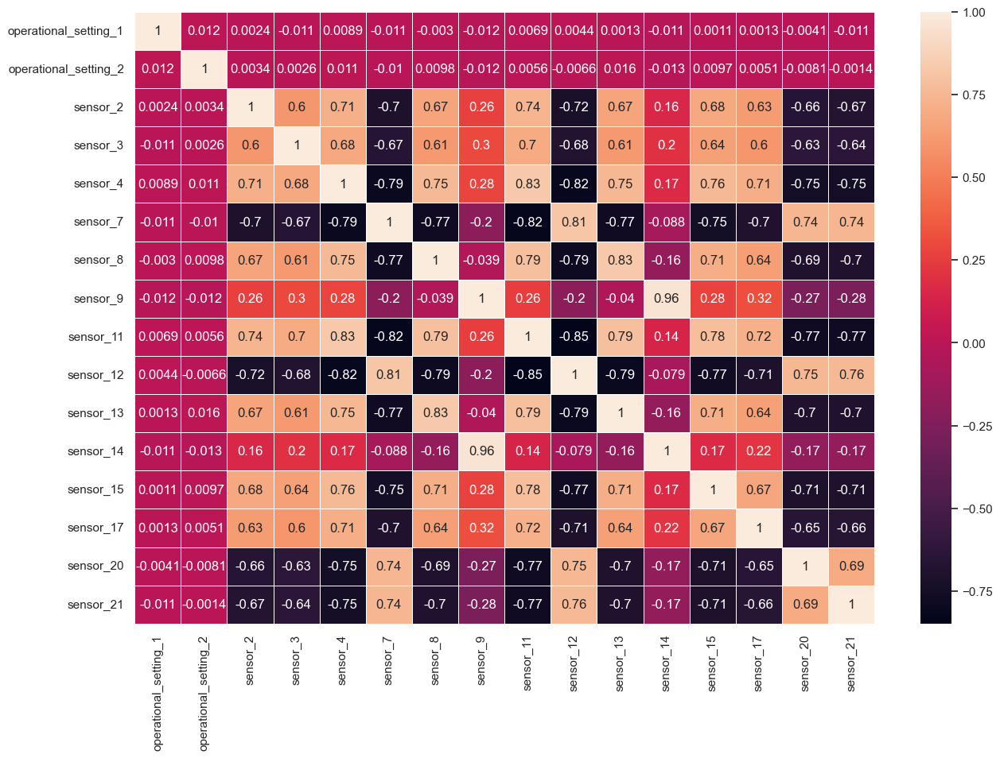

In [13]:
plt.subplots(figsize=(15, 10))
sns.heatmap(train_df[features].corr(), annot=True, cbar=True, linewidths=.5)

# **Dimensionality Reduction**

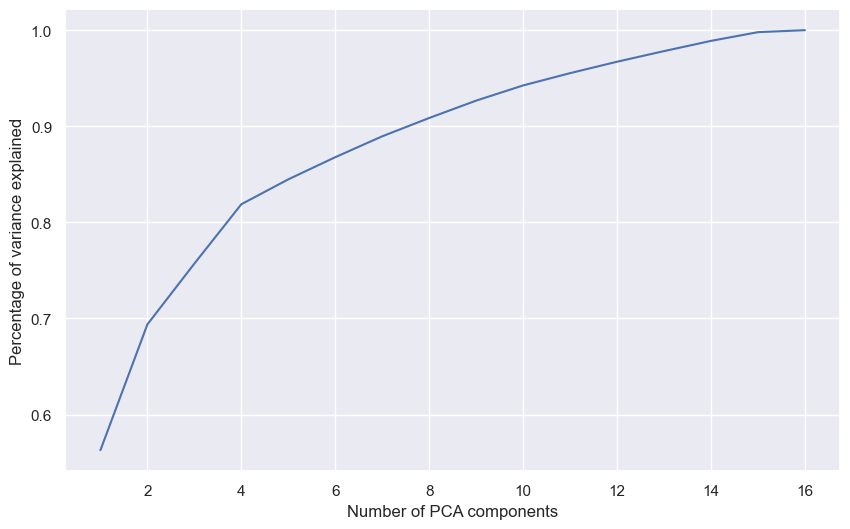

In [14]:
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

pipeline = Pipeline([
    ("scaler", StandardScaler()),   # Mandatory 
    ("pca", PCA())
])
pipeline.fit(train_df[features])
csum_variance = pipeline.named_steps["pca"].explained_variance_ratio_.cumsum()
plt.subplots(figsize=(10, 6))
plt.plot(np.arange(1, csum_variance.shape[0]+1), csum_variance)
plt.xlabel("Number of PCA components")
plt.ylabel("Percentage of variance explained")
plt.show()

In [15]:
# First 2 PC Explain 70% of the Variance

## **Visualize PC 01 & 02**

In [16]:
import plotly.express as px

pipeline = Pipeline([
    ("scaler", StandardScaler()),
    ("pca", PCA(n_components=2))
])
pca_components = pipeline.fit_transform(train_df[features])
for i in range(pca_components.shape[1]):
    train_df[f"pca_component_{i+1}"] = pca_components[:, i]
    
fig = px.scatter_3d(train_df, x="pca_component_1", y="pca_component_2", z="RUL", color="unit_number", size_max=0.002)
fig.update_traces(marker_size = 3)
fig.update_layout(
    title='PCA state visualization',
    title_x=0.5,
    width=800,
    height=800,
    margin=dict(l=65, r=50, b=65, t=90)
)
fig.show()

C:\Users\aksha\AppData\Local\Temp\ipykernel_16880\3469908045.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\aksha\AppData\Local\Temp\ipykernel_16880\3469908045.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



## **Visualize PC 02**

In [17]:
import plotly.express as px
for c in ["pca_component_1", "pca_component_2"]:
    fig = px.scatter(train_df, x=c, y="RUL", color="unit_number", width=800, height=600)
    fig.show()

## **Visualize As Lines**

In [18]:
order = [5, 1, 2, 4, 3]
unit_to_color = { u: order[u % 5] for u in train_df["unit_number"].unique() }
fig = px.scatter_3d(
    train_df.assign(color=train_df.unit_number.apply(unit_to_color.get)),
    x="unit_number", 
    y="pca_component_1", 
    color="color", 
    z="RUL"
)
fig.update_traces(marker_size = 3)
fig.update_layout(
    title='Side by side',
    title_x=0.5,
    width=800,
    height=800,
    margin=dict(l=65, r=50, b=65, t=90)
)
fig.show()

## **Visualization**

In [19]:
order = [5, 1, 2, 4, 3]
unit_to_color = { u: order[u % 5] for u in train_df["unit_number"].unique() }
fig = px.scatter_3d((
    train_df
    # ADDED: the minimum starting RUL of any time series
    .pipe(lambda x: x[x["RUL"] <= x.groupby("unit_number")["time_cycles"].max().min()])
    .assign(
        color=train_df.unit_number.apply(unit_to_color.get)
    )
    .groupby("unit_number", group_keys=False)
    # ADDED: adding a rolling mean of the PCA component
    .apply(lambda x: x.assign(rolling_pca_component_1=lambda x: x.pca_component_1.rolling(window=10).mean()))), 
    x="unit_number", 
    y="rolling_pca_component_1", 
    color="color", 
    z="RUL"
)
fig.update_traces(marker_size = 3)
fig.update_layout(
    title='Side by side',
    title_x=0.5,
    width=800,
    height=800,
    margin=dict(l=65, r=50, b=65, t=90)
)
fig.show()